# Chaos Notebook

This notebook contains examples from naturally occuring chaos. I get inspired by the book "Chaos: Making a New Science." You should totally check that book out if you did not read it before. It would change how you see the world. 

This notebook contains various examples that demonstrate chaos.

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

c:\Users\SnA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\SnA\AppData\Local\Temp\ipykernel_19204\3326327941.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
c:\Users\SnA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\SnA\AppData\Local\Temp\ipykernel_19204\3326327941.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
c:\Users\SnA\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\SnA\AppData\Local\Temp\ipykernel_19204\3326327941.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
c:\U

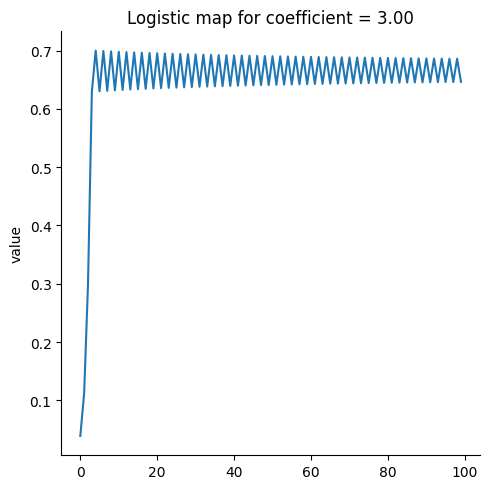

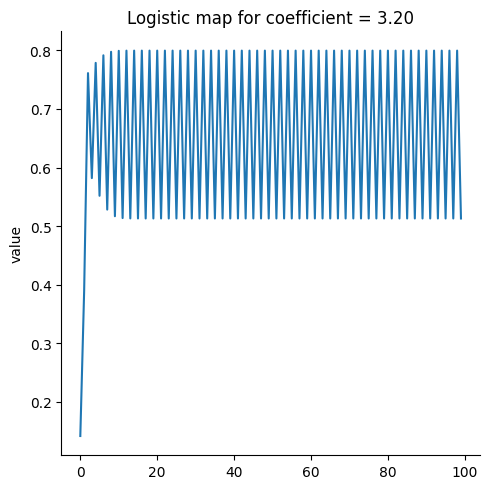

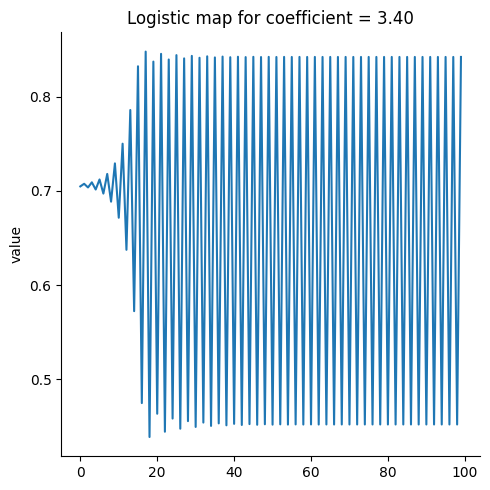

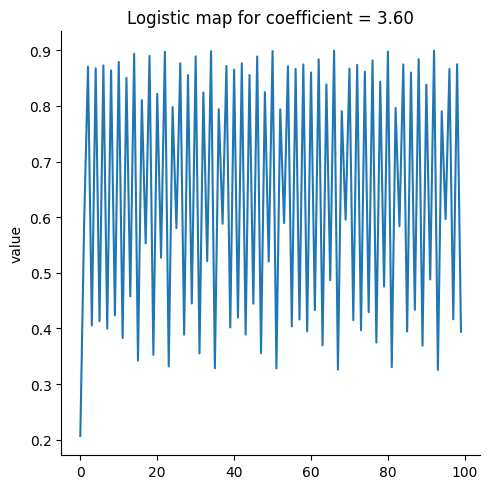

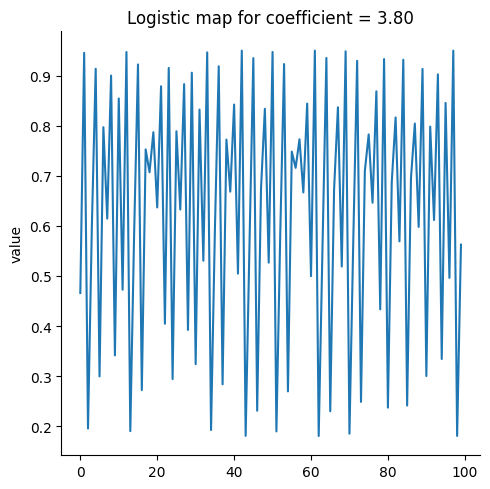

...

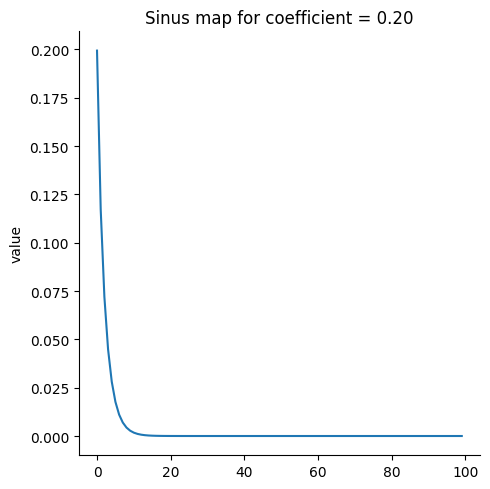

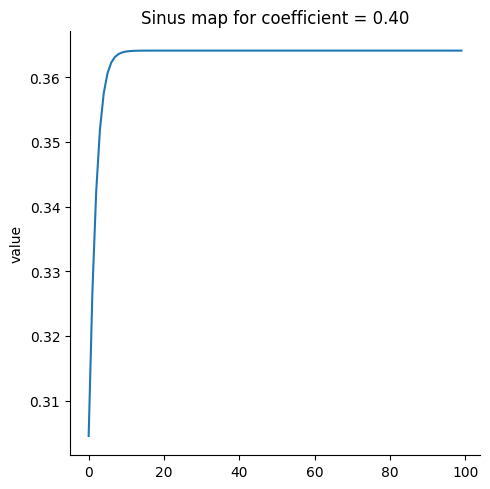

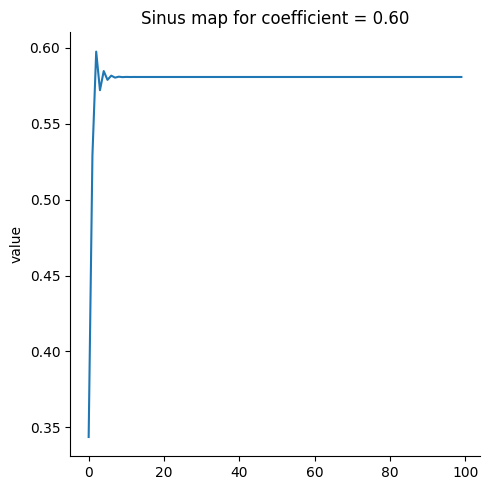

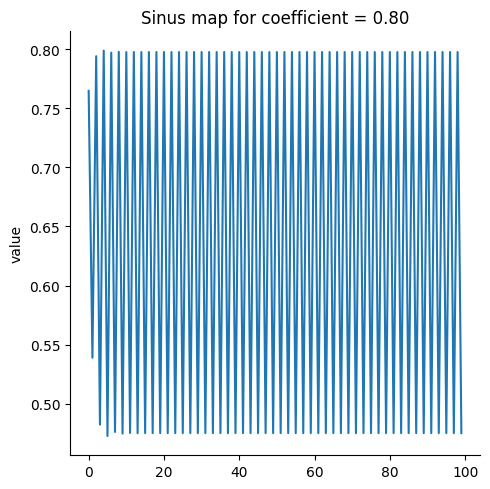

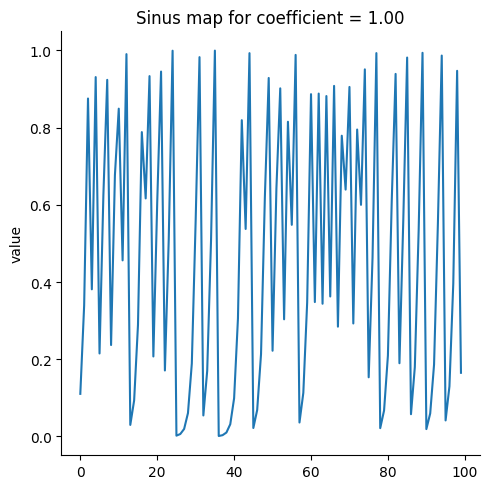

In [3]:
# Logistic map and sin map both lead to chaotic behaviour. Interestingly, both of them give rise to the exactly same bifurcation diagram

def sin_map(coef):
    next_val = np.random.rand()
    for i in range(100):
        next_val = coef * np.sin(np.pi * next_val)
        yield next_val

def logistic_map(coef):
    next_val = np.random.rand()
    for i in range(100):
        next_val = coef * next_val * (1 - next_val)
        yield next_val

coefs = np.arange(3,4.1,0.2)

for coef in coefs:

    values = []

    for value in logistic_map(coef):
        values.append(value)

    df = pd.DataFrame(values, columns=["value"])

    sns.relplot(data=df, x=df.index, kind="line", y="value")
    plt.title(f"Logistic map for coefficient = {coef:.2f}")
    plt.tight_layout()
    plt.plot()

coefs = np.arange(0,1.1,0.2)

for coef in coefs:

    values = []

    for value in sin_map(coef):
        values.append(value)

    df = pd.DataFrame(values, columns=["value"])

    sns.relplot(data=df, x=df.index, kind="line", y="value")
    plt.title(f"Sinus map for coefficient = {coef:.2f}")
    plt.tight_layout()
    plt.plot()

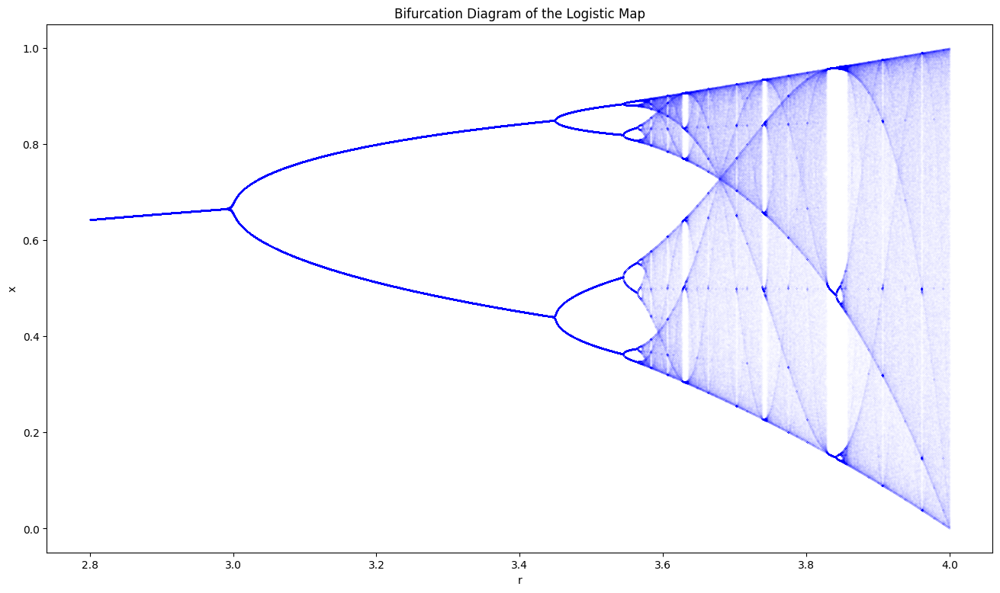

In [63]:
# Taken from wikipedia, graphing the logistic maps bifurcation diagram

interval = (2.8, 4)  # start, end
accuracy = 0.0001
reps = 600  # number of repetitions
numtoplot = 200
lims = np.zeros(reps)

fig, biax = plt.subplots()
fig.set_size_inches(16, 9)

lims[0] = np.random.rand()
for r in np.arange(interval[0], interval[1], accuracy):
    for i in range(reps - 1):
        lims[i + 1] = r * lims[i] * (1 - lims[i])

    biax.plot([r] * numtoplot, lims[reps - numtoplot :], "b.", markersize=0.01)

biax.set(xlabel="r", ylabel="x", title="Bifurcation Diagram of the Logistic Map")
plt.show()

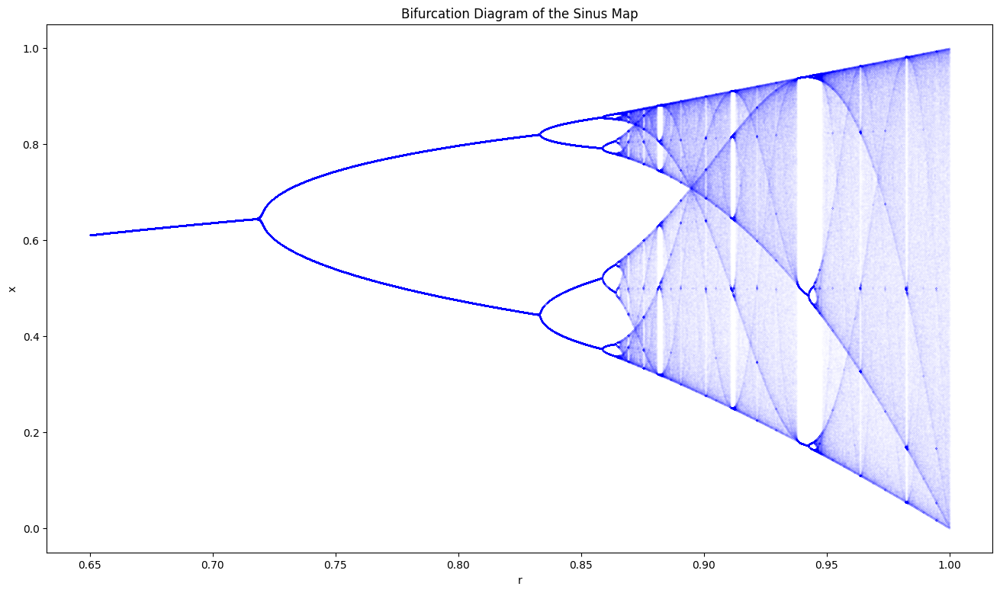

In [71]:
# Code modified to use the sin map, gives rise to the same bifurcation diagram as the logistic map
# Actually, it is the EXACT same bifurcation diagram scaled down by ratio around 1/4

interval = (0.65, 1)  # start, end
accuracy = 0.000025
reps = 600  # number of repetitions
numtoplot = 200
lims = np.zeros(reps)

fig, biax = plt.subplots()
fig.set_size_inches(16, 9)

lims[0] = np.random.rand()
for r in np.arange(interval[0], interval[1], accuracy):
    for i in range(reps - 1):
        lims[i + 1] = r * np.sin(np.pi * lims[i])

    biax.plot([r] * numtoplot, lims[reps - numtoplot :], "b.", markersize=0.01)

biax.set(xlabel="r", ylabel="x", title="Bifurcation Diagram of the Sinus Map")
plt.show()

In [65]:
# Double pendulum code from Mathplotlib's website, modified to work in Jupyter
# Takes around 40 seconds to finish
# I also added trace of the small pendulum, it shows the chaotic behaviour of the pendulum

from numpy import sin, cos
import scipy.integrate as integrate
import matplotlib.animation as animation
from IPython.display import HTML

G = 9.8  # acceleration due to gravity, in m/s^2
L1 = 1.0  # length of pendulum 1 in m
L2 = 1.0  # length of pendulum 2 in m
M1 = 1.0  # mass of pendulum 1 in kg
M2 = 1.0  # mass of pendulum 2 in kg

def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim.to_jshtml())

def derivs(state, t):

    dydx = np.zeros_like(state)
    dydx[0] = state[1]

    delta = state[2] - state[0]
    den1 = (M1+M2) * L1 - M2 * L1 * cos(delta) * cos(delta)
    dydx[1] = ((M2 * L1 * state[1] * state[1] * sin(delta) * cos(delta)
                + M2 * G * sin(state[2]) * cos(delta)
                + M2 * L2 * state[3] * state[3] * sin(delta)
                - (M1+M2) * G * sin(state[0]))
               / den1)

    dydx[2] = state[3]

    den2 = (L2/L1) * den1
    dydx[3] = ((- M2 * L2 * state[3] * state[3] * sin(delta) * cos(delta)
                + (M1+M2) * G * sin(state[0]) * cos(delta)
                - (M1+M2) * L1 * state[1] * state[1] * sin(delta)
                - (M1+M2) * G * sin(state[2]))
               / den2)

    return dydx

# create a time array from 0..100 sampled at 0.05 second steps
dt = 0.05
t = np.arange(0, 20, dt)

# th1 and th2 are the initial angles (degrees)
# w10 and w20 are the initial angular velocities (degrees per second)
th1 = 120.0
w1 = 0.0
th2 = -10.0
w2 = 0.0

# initial state
state = np.radians([th1, w1, th2, w2])

# integrate your ODE using scipy.integrate.
y = integrate.odeint(derivs, state, t)

x1 = L1*sin(y[:, 0])
y1 = -L1*cos(y[:, 0])

x2 = L2*sin(y[:, 2]) + x1
y2 = -L2*cos(y[:, 2]) + y1

fig = plt.figure()
ax = fig.add_subplot(111, autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], 'o-', lw=2)
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text

trace_x2 = []
trace_y2 = []

def animate(i):
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]

    line.set_data(thisx, thisy)
    time_text.set_text(time_template % (i*dt))

    trace_x2.append(x2[i])
    trace_y2.append(y2[i])

    return line, time_text

ani = animation.FuncAnimation(fig, animate, range(1, len(y)),
                              interval=dt*1000, blit=True, init_func=init)

# Display the animation
display_animation(ani)


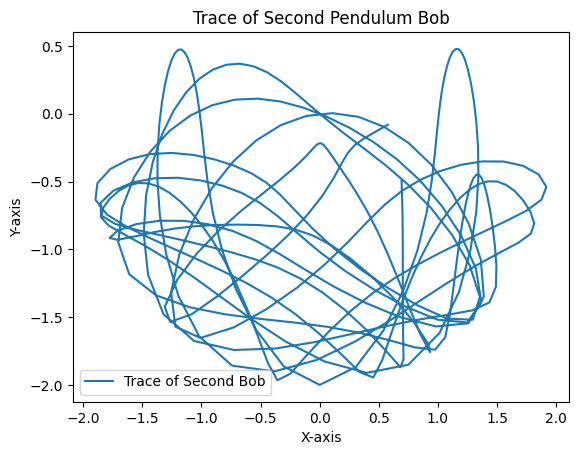

In [66]:
# Here, plot the trace of the second bob

plt.figure()
plt.plot(trace_x2, trace_y2, label='Trace of Second Bob')
plt.title('Trace of Second Pendulum Bob')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend()
plt.show()

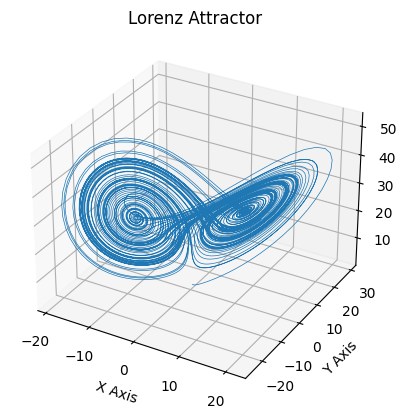

In [67]:
# Lorenz attractor from the Matplotlib website
# Mathematician and meterologist Edward Lorenz discovered this attractor while studying weather formulas
# Interestingly, lines that you see on the graph NEVER intersect with eachother, very strange


def lorenz(xyz, *, s=10, r=28, b=2.667):
    """
    Parameters
    ----------
    xyz : array-like, shape (3,)
       Point of interest in three-dimensional space.
    s, r, b : float
       Parameters defining the Lorenz attractor.

    Returns
    -------
    xyz_dot : array, shape (3,)
       Values of the Lorenz attractor's partial derivatives at *xyz*.
    """
    x, y, z = xyz
    x_dot = s*(y - x)
    y_dot = r*x - y - x*z
    z_dot = x*y - b*z
    return np.array([x_dot, y_dot, z_dot])


dt = 0.01
num_steps = 10000

xyzs = np.empty((num_steps + 1, 3))  # Need one more for the initial values
xyzs[0] = (0., 1., 1.05)  # Set initial values
# Step through "time", calculating the partial derivatives at the current point
# and using them to estimate the next point
for i in range(num_steps):
    xyzs[i + 1] = xyzs[i] + lorenz(xyzs[i]) * dt

# Plot
ax = plt.figure().add_subplot(projection='3d')

ax.plot(*xyzs.T, lw=0.5)
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")

plt.show()

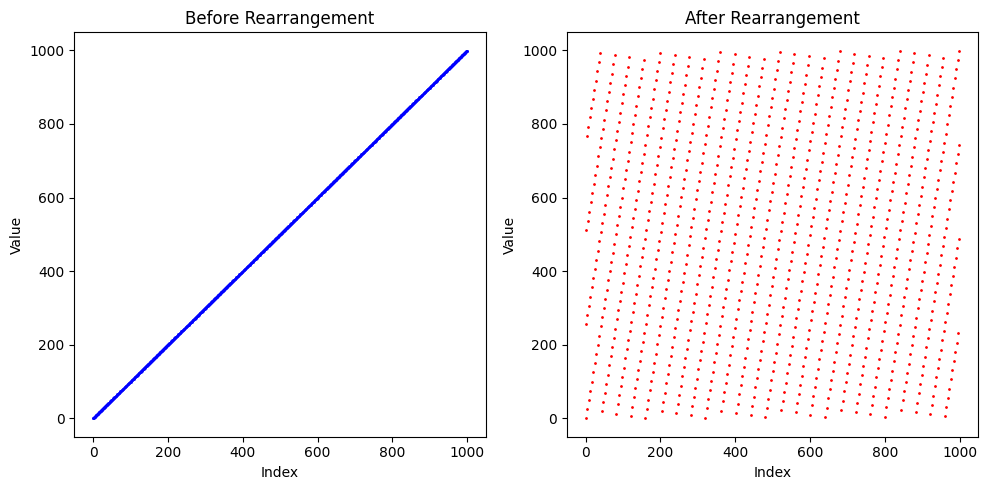

In [11]:
# Horseshoe map is also chaotic
# Stephen Smale found this map
# At each iteration, re-index numbers such as it follows:

# x -> 2x for x <= (n/2)
# x -> (2x-0.5)+step for x > n/2
# where n is the sample size and step is the smallest increment

# It is similar to folding a dough and squashing two pieces together, then repeating it
# It is chaotic, so it is not trivial to find which point goes to where

def rearrange_points(mylist, size):
    cut_point = size/2

    new_list = np.zeros(size)

    for i in range(0,int(cut_point)):
        index = int(2*i)
        new_list[index] = mylist[i]

    for i in range(int(cut_point/2), int(size)):
        index = int(2*(i-size/2)+1)
        new_list[index] = mylist[i]

    return new_list

size = 1000
iterations = 100

points = np.arange(0,size)

for i in range(iterations):
    points = rearrange_points(points, size)

old_points = np.arange(0,size)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.scatter(range(size), old_points, s=1, color='blue', marker='o')
plt.title('Before Rearrangement')
plt.xlabel('Index')
plt.ylabel('Value')

plt.subplot(1, 2, 2)
plt.scatter(range(size), points, s=1, color='red', marker='o')
plt.title('After Rearrangement')
plt.xlabel('Index')
plt.ylabel('Value')

plt.tight_layout()
plt.show()



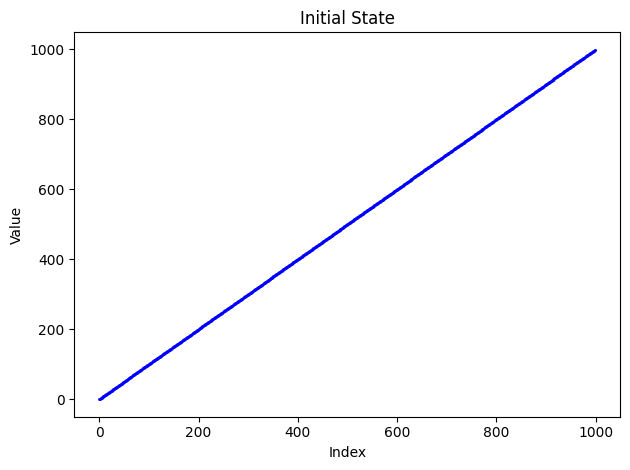

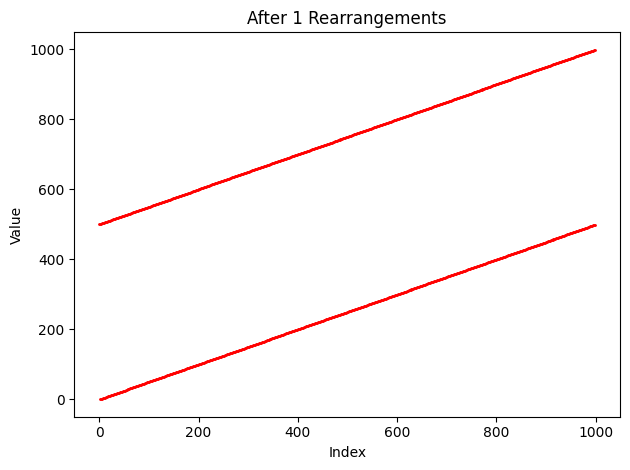

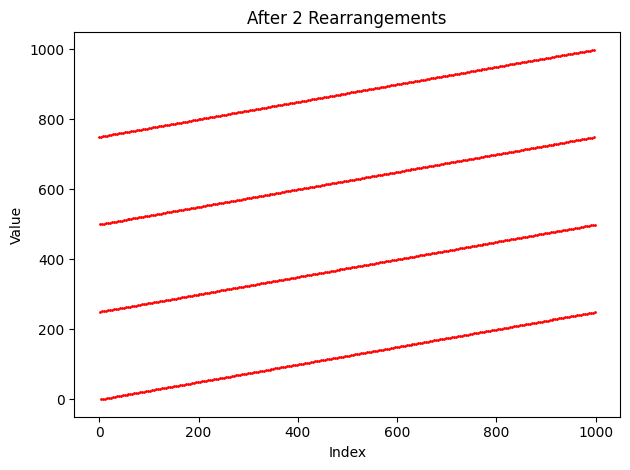

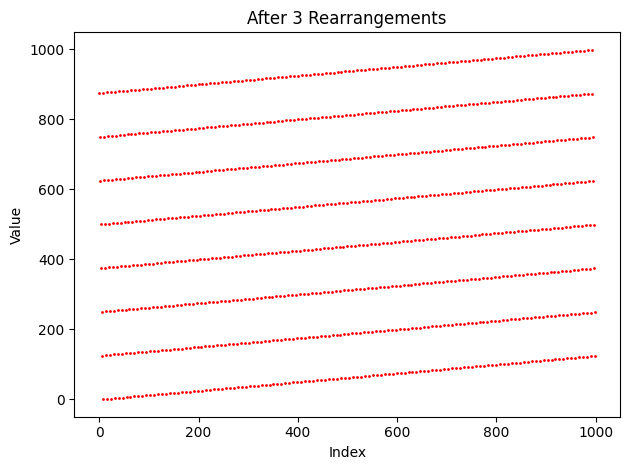

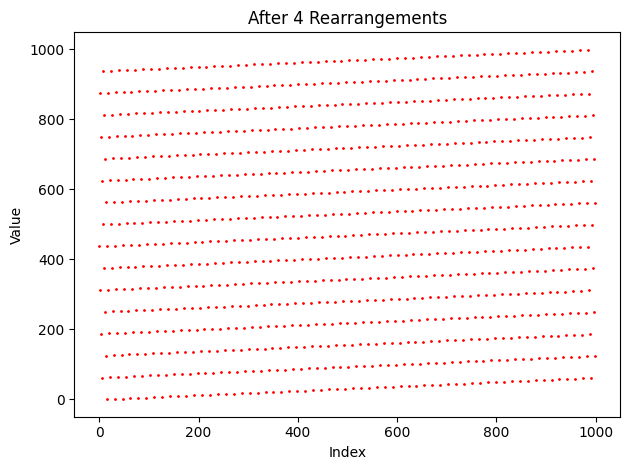

...

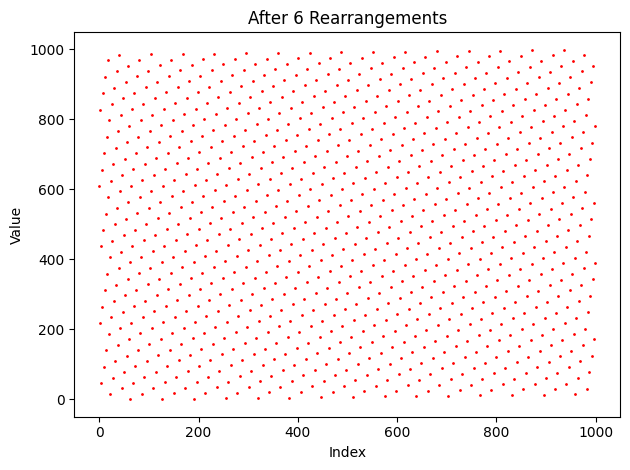

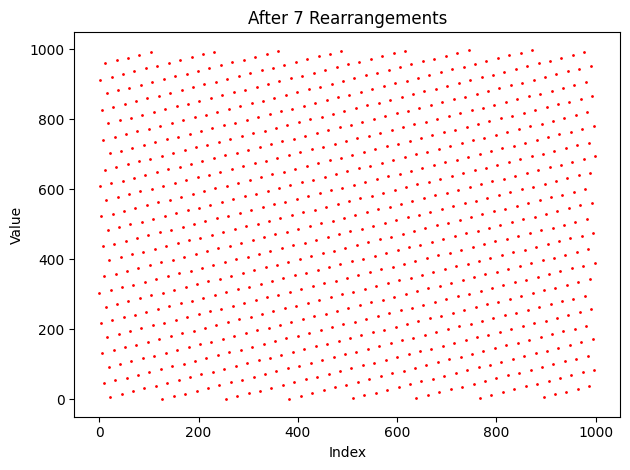

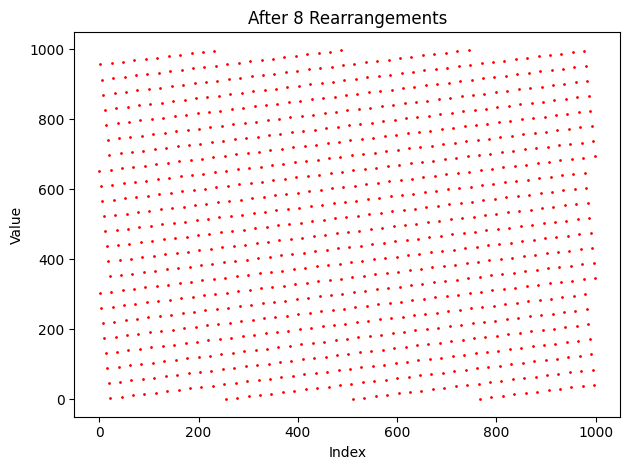

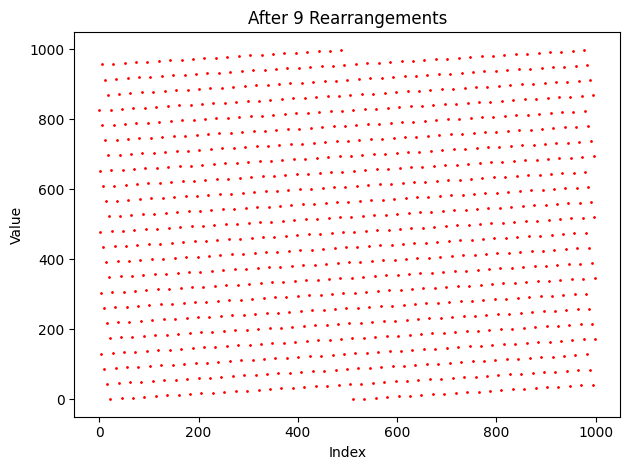

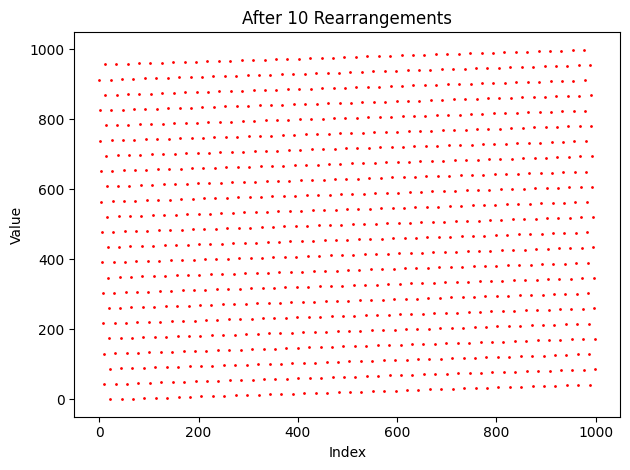

In [36]:
import numpy as np
import matplotlib.pyplot as plt

def rearrange_points(mylist, size):
    cut_point = size / 2

    new_list = np.zeros(size)

    for i in range(0, int(cut_point)):
        index = int(2 * i + 1)
        new_list[index] = mylist[i]

    for i in range(int(cut_point / 2), int(size)):
        index = int(2 * (i - size / 2))
        new_list[index] = mylist[i]

    return new_list

size = 1000
iterations = 10
plot_interval = 1  # Plot after every 10 iterations

points = np.arange(0, size)

# Plotting the horseshoe map at the initial state
plt.scatter(range(size), points, s=1, color='blue')
plt.title('Initial State')
plt.xlabel('Index')
plt.ylabel('Value')
plt.tight_layout()
plt.show()

for i in range(iterations):
    points = rearrange_points(points, size)
    if i % plot_interval == 0:
        plt.scatter(range(size), points, s=1, color='red')
        plt.title(f'After {i+1} Rearrangements')
        plt.xlabel('Index')
        plt.ylabel('Value')
        plt.tight_layout()
        plt.show()



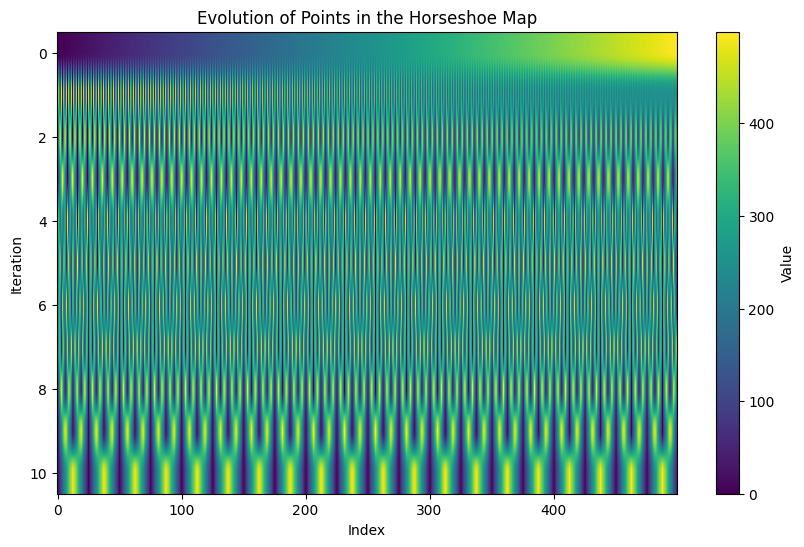

In [42]:
# I made ChatGPT 3.5 write a visualization method that shows how individual points move over iterations
# The results look stunning, wow

import numpy as np
import matplotlib.pyplot as plt

def rearrange_points_rotate(mylist, size):
    cut_point = size / 2

    new_list = np.zeros(size)

    for i in range(0, int(cut_point)):
        index = int(2 * i)
        new_list[index] = mylist[i]

    for i in range(int(cut_point), int(size)):
        index = int(2*(size - i-1)+1) # 500 + k = i, k = i - 500 , index = 500 - k = 500 - i + 500 = 1000 - i
        new_list[index] = mylist[i]

    return new_list

size = 500
iterations = 10

points = np.arange(0, size)

# Create a 2D array to store the evolution of points
evolution = np.zeros((iterations + 1, size))
evolution[0, :] = points

# Iterating through the horseshoe map and recording the evolution
for i in range(iterations):
    points = rearrange_points_rotate(points, size)
    evolution[i + 1, :] = points

# Plotting the evolution
plt.figure(figsize=(10, 6))
plt.imshow(evolution, cmap='viridis', aspect='auto')
plt.colorbar(label='Value')
plt.title('Evolution of Points in the Horseshoe Map')
plt.xlabel('Index')
plt.ylabel('Iteration')
plt.show()

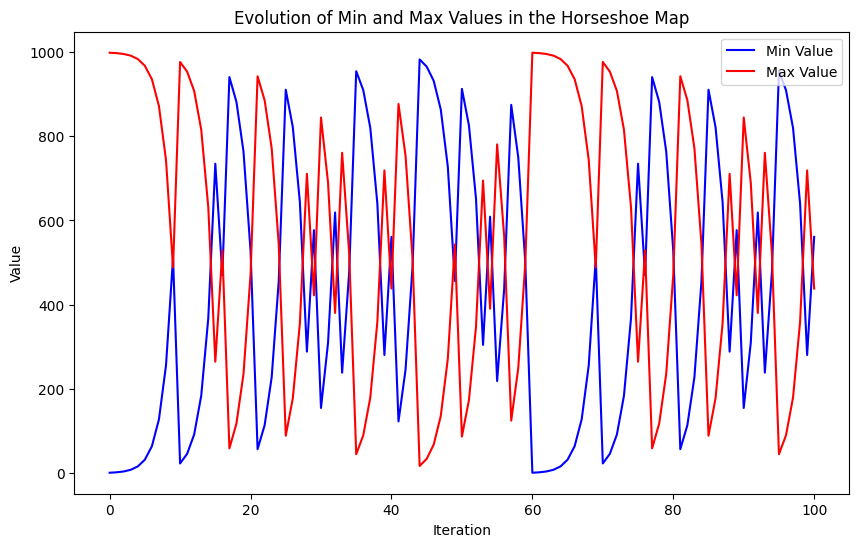

In [38]:
size = 1000
iterations = 100

points = np.arange(0, size)

# Create arrays to track the evolution of min and max values
min_values = np.zeros(iterations + 1)
max_values = np.zeros(iterations + 1)

# Initial values
min_values[0] = np.min(points)
max_values[0] = np.max(points)

# Iterating through the horseshoe map and recording the evolution
for i in range(iterations):
    points = rearrange_points(points, size)
    min_values[i + 1] = np.argmin(points)
    max_values[i + 1] = np.argmax(points)

# Plotting the evolution of min and max values
plt.figure(figsize=(10, 6))
plt.plot(range(iterations + 1), min_values, label='Min Value', color='blue')
plt.plot(range(iterations + 1), max_values, label='Max Value', color='red')
plt.title('Evolution of Min and Max Values in the Horseshoe Map')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.legend()
plt.show()


In [6]:
# Taken from geeksforgeeks

# Python code for Mandelbrot Fractal

# Import necessary libraries
from PIL import Image
from numpy import array
import colorsys

# setting the width of the output image as 1024
WIDTH = 1024

# a function to return a tuple of colors
# as integer value of rgb
def rgb_conv(i):
	color = 255 * array(colorsys.hsv_to_rgb(i / 255.0, 1.0, 0.5))
	return tuple(color.astype(int))

# function defining a mandelbrot
def mandelbrot(x, y):
	c0 = complex(x, y)
	c = 0
	for i in range(1, 1000):
		if abs(c) > 2:
			return rgb_conv(i)
		c = c * c + c0
	return (0, 0, 0)

# creating the new image in RGB mode
img = Image.new('RGB', (WIDTH, int(WIDTH / 2)))
pixels = img.load()

for x in range(img.size[0]):

	# displaying the progress as percentage
	print("%.2f %%" % (x / WIDTH * 100.0)) 
	for y in range(img.size[1]):
		pixels[x, y] = mandelbrot((x - (0.75 * WIDTH)) / (WIDTH / 4),
									(y - (WIDTH / 4)) / (WIDTH / 4))

# to display the created fractal after 
# completing the given number of iterations
img.show()


0.00 %
0.10 %
0.20 %
0.29 %
0.39 %
0.49 %
0.59 %
0.68 %
0.78 %
0.88 %
0.98 %
1.07 %
1.17 %
1.27 %
1.37 %
1.46 %
1.56 %
1.66 %
1.76 %
1.86 %
1.95 %
2.05 %
2.15 %
2.25 %
2.34 %
2.44 %
2.54 %
2.64 %
2.73 %
2.83 %
2.93 %
3.03 %
3.12 %
3.22 %
3.32 %
3.42 %
3.52 %
3.61 %
3.71 %
3.81 %
3.91 %
4.00 %
4.10 %
4.20 %
4.30 %
4.39 %
4.49 %
4.59 %
4.69 %
4.79 %
4.88 %
4.98 %
5.08 %
5.18 %
5.27 %
5.37 %
5.47 %
5.57 %
5.66 %
5.76 %
5.86 %
5.96 %
6.05 %
6.15 %
6.25 %
6.35 %
6.45 %
6.54 %
6.64 %
6.74 %
6.84 %
6.93 %
7.03 %
7.13 %
7.23 %
7.32 %
7.42 %
7.52 %
7.62 %
7.71 %
7.81 %
7.91 %
8.01 %
8.11 %
8.20 %
8.30 %
8.40 %
8.50 %
8.59 %
8.69 %
8.79 %
8.89 %
8.98 %
9.08 %
9.18 %
9.28 %
9.38 %
9.47 %
9.57 %
9.67 %
9.77 %
9.86 %
9.96 %
10.06 %
10.16 %
10.25 %
10.35 %
10.45 %
10.55 %
10.64 %
10.74 %
10.84 %
10.94 %
11.04 %
11.13 %
11.23 %
11.33 %
11.43 %
11.52 %
11.62 %
11.72 %
11.82 %
11.91 %
12.01 %
12.11 %
12.21 %
12.30 %
12.40 %
12.50 %
12.60 %
12.70 %
12.79 %
12.89 %
12.99 %
13.09 %
13.18 %
13.28 %
13.38 %

In [ ]:
nums = [0,0]

def mandelbox_iterate(nums, scale, c):

    for i, num in enumerate(nums):
        if num > 0:
            nums[i] = 2 - num
        elif num < -1:
            nums[i] = -2 - num
    
    mag = sum([num*num for num in nums])**0.5

    if mag < 0.5:
        for i, num in enumerate(nums):
            nums[i] = num * 4
    elif mag < 1:
        for i, num in enumerate(nums):
            nums[i] = num / mag

    for i, num in enumerate(nums):
        nums[i] = scale * num + c
    
    return nums

WIDTH = 1024

def mandelbox(nums):

	for i in range(1, 1000):
		if sum([num*num for num in nums])**0.5 > 2:
			return rgb_conv(i)
		nums = mandelbox_iterate(nums, -1.5, i)
	return (0, 0, 0)

# creating the new image in RGB mode
img = Image.new('RGB', (WIDTH, int(WIDTH / 2)))
pixels = img.load()

for x in range(img.size[0]):

	# displaying the progress as percentage
	print("%.2f %%" % (x / WIDTH * 100.0)) 
	for y in range(img.size[1]):
		pixels[x, y] = mandelbox((x - (0.75 * WIDTH)) / (WIDTH / 4),
									(y - (WIDTH / 4)) / (WIDTH / 4))

# to display the created fractal after 
# completing the given number of iterations
img.show()


In [19]:
# Import necessary libraries
from PIL import Image, ImageDraw
from numpy import array
import colorsys
import numpy as np

# setting the width of the output image as 1024
WIDTH = 1024
ITER = 3000

# a function to return a tuple of colors
# as an integer value of rgb
def rgb_conv(iteration):
    max_iter = ITER

    # If the point is not in the set, return white
    if iteration == max_iter:
        return (255, 255, 255)

    # Color scaling from black to blue to white
    hue = iteration / max_iter  # Normalize iteration to [0, 1]
    color = colorsys.hsv_to_rgb(0.66 - 0.66 * hue, 1.0, 1.0)  # Blue hue
    return tuple(int(c * 255) for c in color)

"""
# function defining a Mandelbox
def mandelbox(x, y):
    max_iter = ITER
    scale = -1.41

    # Initial position
    c = complex(x, y)

    for i in range(max_iter):
        # Mandelbox iteration
        for j in range(3):
            if c.real > 1:
                c = 2 - c.real + 1j * c.imag
            elif c.real < -1:
                c = -2 - c.real + 1j * c.imag

            if c.imag > 1:
                c = 1j * (2 - c.imag) + c.real
            elif c.imag < -1:
                c = 1j * (-2 - c.imag) + c.real

        # Scale and translate
        if abs(c) < 0.5:
            c = c * 4
        elif abs(c) < 1:
            c = c / abs(c)**2

        c = scale * c + complex(x, y)

        if abs(c.real) > 2 or abs(c.imag) > 2:
            return rgb_conv(i)

    return (0, 0, 0)
"""



# creating the new image in RGB mode
img = Image.new('RGB', (WIDTH, WIDTH))



pixels = img.load()

for x in range(img.size[0]):
    # displaying the progress as percentage
    print("%.2f %%" % (x / WIDTH * 100.0)) 
    for y in range(img.size[1]):
        pixels[x, y] = mandelbox((x - (WIDTH / 2)) / (WIDTH / 2),
                                (y - (WIDTH / 2)) / (WIDTH / 2))

draw = ImageDraw.Draw(img)

# Draw horizontal and vertical axes
draw.line([(0, img.size[1] / 2), (img.size[0], img.size[1] / 2)], fill=(255, 255, 255), width=1)  # Horizontal axis
draw.line([(img.size[0] / 2, 0), (img.size[0] / 2, img.size[1])], fill=(255, 255, 255), width=1)  # Vertical axis

# to display the created fractal after 
# completing the given number of iterations
img.show()

0.00 %
0.10 %
0.20 %
0.29 %
0.39 %
0.49 %
0.59 %
0.68 %
0.78 %
0.88 %
0.98 %
1.07 %
1.17 %
1.27 %
1.37 %
1.46 %
1.56 %
1.66 %
1.76 %
1.86 %
1.95 %
2.05 %
2.15 %
2.25 %
2.34 %
2.44 %
2.54 %
2.64 %
2.73 %
2.83 %
2.93 %
3.03 %
3.12 %
3.22 %
3.32 %
3.42 %
3.52 %
3.61 %
3.71 %
3.81 %
3.91 %
4.00 %
4.10 %
4.20 %
4.30 %
4.39 %
4.49 %
4.59 %
4.69 %
4.79 %
4.88 %
4.98 %
5.08 %
5.18 %
5.27 %
5.37 %
5.47 %
5.57 %
5.66 %
5.76 %
5.86 %
5.96 %
6.05 %
6.15 %
6.25 %
6.35 %
6.45 %
6.54 %
6.64 %
6.74 %
6.84 %
6.93 %
7.03 %
7.13 %
7.23 %
7.32 %
7.42 %
7.52 %
7.62 %
7.71 %
7.81 %
7.91 %
8.01 %
8.11 %
8.20 %
8.30 %
8.40 %
8.50 %
8.59 %
8.69 %
8.79 %
8.89 %
8.98 %
9.08 %
9.18 %
9.28 %
9.38 %
9.47 %
9.57 %
9.67 %
9.77 %
9.86 %
9.96 %
10.06 %
10.16 %
10.25 %
10.35 %
10.45 %
10.55 %
10.64 %


C:\Users\SnA\AppData\Local\Temp\ipykernel_11408\2063096557.py:72: ComplexWarning: Casting complex values to real discards the imaginary part
  c[0] = 2 - c[0] + 1j * c[1] if mask_real_gt_1 else c[0]


10.74 %
10.84 %
10.94 %
11.04 %
11.13 %
11.23 %
11.33 %
11.43 %
11.52 %
11.62 %
11.72 %
11.82 %
11.91 %
12.01 %
12.11 %
12.21 %
12.30 %
12.40 %
12.50 %
12.60 %
12.70 %
12.79 %
12.89 %
12.99 %
13.09 %
13.18 %
13.28 %
13.38 %
13.48 %
13.57 %
13.67 %
13.77 %
13.87 %
13.96 %
14.06 %
14.16 %


C:\Users\SnA\AppData\Local\Temp\ipykernel_11408\2063096557.py:75: ComplexWarning: Casting complex values to real discards the imaginary part
  c[0] = -2 - c[0] + 1j * c[1] if mask_real_lt_neg_1 else c[0]


TypeError: float() argument must be a string or a real number, not 'complex'

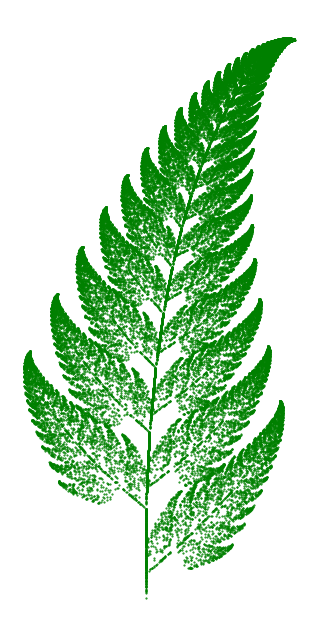

In [5]:
import matplotlib.pyplot as plt
import random

# Barnsley fern code, converted from wikipedia psuedocode by using chatgpt

# Set up the plot
plt.figure(figsize=(8, 8))
plt.axis('off')
plt.gca().set_aspect('equal', adjustable='box')

# Initialize variables
x, y = 0.0, 0.0
n = 0
max_iterations = 50000

while n < max_iterations:
    # Generate a random number
    r = random.random()

    # Apply transformations based on the probability
    if r < 0.01:
        xn, yn = 0.0, 0.16 * y
    elif r < 0.86:
        xn = 0.85 * x + 0.04 * y
        yn = -0.04 * x + 0.85 * y + 1.6
    elif r < 0.93:
        xn = 0.2 * x - 0.26 * y
        yn = 0.23 * x + 0.22 * y + 1.6
    else:
        xn = -0.15 * x + 0.28 * y
        yn = 0.26 * x + 0.24 * y + 0.44

    # Draw the pixel
    plt.plot(xn, yn, 'g.', markersize=1)

    # Update variables
    x, y = xn, yn
    n += 1

# Show the plot
plt.show()